# Project: cleanning - [candy data]
### this notebook is for educational purpose . in this notebook we will do some cleanning

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">wrangling</a></li>
  
</ul>

<a id='intro'></a>
## Introduction

### Dataset Description 

> i will go through candy data 2017 , this data has :
- Internal_ID
- Q1-Going Out?: Are you actually going trick or treating yourself? "has values `Yes or No`"
- Q2-Gender: It has four different options, `Femal ,Male ,Other ,I'd rather not say`
- Q3-Age: Numerical field
- Q4-Country: Text Field, but users have written their own version of the names. Example, for America, there are entries such as USA, us, US, America so we should consider that while cleanning
- Q5-State/Province: Text Field, but users have written their own version of the names. Same as the country data.
- Q6-Joy Or Despair: All kinds of chocolate bars are the questions with three distinct options to choose from (Joy, Meh, Despair).
- Q7-Joy Other: Text Field to write items not included above that give you JOY. Lots of missing values.
- Q8-Despair Other: Text Field ti write items not included above that give you DESPAIR. Lots of missing values.
- Q9-Other Comments: Text Field. Lots of missing values.
- Q10-Dress: Binary field. Missing values present
- Unnamed: 113
- Q11-Day: Binary Answer Field. Missing values present


# 1- import packages and load data

In [3]:
import pandas  as pd
import numpy as np
import seaborn as sns
from fuzzywuzzy import process, fuzz
df=pd.read_excel('candyhierarchy2017.xlsx')


C:\Users\alyah\anaconda3\Lib\site-packages\openpyxl\worksheet\_read_only.py:79: UserWarning: Unknown extension is not supported and will be removed
  for idx, row in parser.parse():


<a id='wrangling'></a>
## Data Wrangling



### General Properties

# 2- show some general properties for the data 

In [82]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [83]:
df.describe()

,Internal ID,Q12: MEDIA [Daily Dish],Q12: MEDIA [Science],Q12: MEDIA [ESPN],Q12: MEDIA [Yahoo]
count,2.460000e+03,85.0,1362.0,99.0,67.0
mean,9.028016e+07,1.0,1.0,1.0,1.0
std,7.435532e+03,0.0,0.0,0.0,0.0
min,9.025877e+07,1.0,1.0,1.0,1.0
25%,9.027520e+07,1.0,1.0,1.0,1.0
50%,9.027780e+07,1.0,1.0,1.0,1.0
75%,9.028242e+07,1.0,1.0,1.0,1.0
max,9.031480e+07,1.0,1.0,1.0,1.0


In [84]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2460 entries, 0 to 2459
Columns: 120 entries, Internal ID to Click Coordinates (x, y)
dtypes: float64(4), int64(1), object(115)
memory usage: 2.3+ MB


In [85]:
df.head()

,Internal ID,Q1: GOING OUT?,Q2: GENDER,Q3: AGE,Q4: COUNTRY,"Q5: STATE, PROVINCE, COUNTY, ETC",Q6 | 100 Grand Bar,Q6 | Anonymous brown globs that come in black and orange wrappers\t(a.k.a. Mary Janes),Q6 | Any full-sized candy bar,Q6 | Black Jacks,Q6 | Bonkers (the candy),Q6 | Bonkers (the board game),Q6 | Bottle Caps,Q6 | Box'o'Raisins,Q6 | Broken glow stick,Q6 | Butterfinger,Q6 | Cadbury Creme Eggs,Q6 | Candy Corn,Q6 | Candy that is clearly just the stuff given out for free at restaurants,Q6 | Caramellos,"Q6 | Cash, or other forms of legal tender",Q6 | Chardonnay,Q6 | Chick-o-Sticks (we don’t know what that is),Q6 | Chiclets,Q6 | Coffee Crisp,Q6 | Creepy Religious comics/Chick Tracts,Q6 | Dental paraphenalia,Q6 | Dots,Q6 | Dove Bars,Q6 | Fuzzy Peaches,Q6 | Generic Brand Acetaminophen,Q6 | Glow sticks,Q6 | Goo Goo Clusters,Q6 | Good N' Plenty,Q6 | Gum from baseball cards,Q6 | Gummy Bears straight up,Q6 | Hard Candy,Q6 | Healthy Fruit,Q6 | Heath Bar,Q6 | Hershey's Dark Chocolate,Q6 | Hershey’s Milk Chocolate,Q6 | Hershey's Kisses,Q6 | Hugs (actual physical hugs),Q6 | Jolly Rancher (bad flavor),Q6 | Jolly Ranchers (good flavor),Q6 | JoyJoy (Mit Iodine!),Q6 | Junior Mints,Q6 | Senior Mints,Q6 | Kale smoothie,Q6 | Kinder Happy Hippo,Q6 | Kit Kat,Q6 | LaffyTaffy,Q6 | LemonHeads,Q6 | Licorice (not black),Q6 | Licorice (yes black),Q6 | Lindt Truffle,Q6 | Lollipops,Q6 | Mars,Q6 | Maynards,Q6 | Mike and Ike,Q6 | Milk Duds,Q6 | Milky Way,Q6 | Regular M&Ms,Q6 | Peanut M&M’s,Q6 | Blue M&M's,Q6 | Red M&M's,Q6 | Green Party M&M's,Q6 | Independent M&M's,Q6 | Abstained from M&M'ing.,Q6 | Minibags of chips,Q6 | Mint Kisses,Q6 | Mint Juleps,Q6 | Mr. Goodbar,Q6 | Necco Wafers,Q6 | Nerds,Q6 | Nestle Crunch,Q6 | Now'n'Laters,Q6 | Peeps,Q6 | Pencils,Q6 | Pixy Stix,Q6 | Real Housewives of Orange County Season 9 Blue-Ray,Q6 | Reese’s Peanut Butter Cups,Q6 | Reese's Pieces,Q6 | Reggie Jackson Bar,Q6 | Rolos,Q6 | Sandwich-sized bags filled with BooBerry Crunch,Q6 | Skittles,Q6 | Smarties (American),Q6 | Smarties (Commonwealth),Q6 | Snickers,Q6 | Sourpatch Kids (i.e. abominations of nature),Q6 | Spotted Dick,Q6 | Starburst,Q6 | Sweet Tarts,Q6 | Swedish Fish,Q6 | Sweetums (a friend to diabetes),Q6 | Take 5,Q6 | Tic Tacs,Q6 | Those odd marshmallow circus peanut things,Q6 | Three Musketeers,Q6 | Tolberone something or other,Q6 | Trail Mix,Q6 | Twix,"Q6 | Vials of pure high fructose corn syrup, for main-lining into your vein",Q6 | Vicodin,Q6 | Whatchamacallit Bars,Q6 | White Bread,Q6 | Whole Wheat anything,Q6 | York Peppermint Patties,Q7: JOY OTHER,Q8: DESPAIR OTHER,Q9: OTHER COMMENTS,Q10: DRESS,Unnamed: 113,Q11: DAY,Q12: MEDIA [Daily Dish],Q12: MEDIA [Science],Q12: MEDIA [ESPN],Q12: MEDIA [Yahoo],"Click Coordinates (x, y)"
0,90258773,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,90272821,No,Male,44,USA,NM,MEH,DESPAIR,JOY,MEH,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,MEH,MEH,DESPAIR,MEH,JOY,MEH,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,MEH,JOY,DESPAIR,DESPAIR,DESPAIR,DESPAIR,MEH,DESPAIR,MEH,MEH,DESPAIR,MEH,JOY,JOY,MEH,DESPAIR,DESPAIR,MEH,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,JOY,DESPAIR,MEH,MEH,JOY,MEH,DESPAIR,DESPAIR,DESPAIR,MEH,MEH,JOY,JOY,MEH,JOY,JOY,JOY,JOY,DESPAIR,DESPAIR,MEH,DESPAIR,DESPAIR,DESPAIR,DESPAIR,JOY,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,JOY,JOY,DESPAIR,JOY,DESPAIR,DESPAIR,DESPAIR,DESPAIR,MEH,DESPAIR,DESPAIR,MEH,DESPAIR,MEH,DESPAIR,DESPAIR,DESPAIR,DESPAIR,JOY,JOY,DESPAIR,JOY,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,Mounds,NaN,Bottom line is Twix is really the only candy w...,White and gold,NaN,Sunday,Na

In [86]:
df.dtypes.to_frame()

,0
Internal ID,int64
Q1: GOING OUT?,object
Q2: GENDER,object
Q3: AGE,object
Q4: COUNTRY,object
"Q5: STATE, PROVINCE, COUNTY, ETC",object
Q6 | 100 Grand Bar,object
Q6 | Anonymous brown globs that come in black and orange wrappers\t(a.k.a. Mary Janes),object
Q6 | Any full-sized candy bar,object
Q6 | Black Jacks,object


In [87]:
df.isna().sum().to_frame()

,0
Internal ID,0
Q1: GOING OUT?,110
Q2: GENDER,41
Q3: AGE,84
Q4: COUNTRY,64
"Q5: STATE, PROVINCE, COUNTY, ETC",100
Q6 | 100 Grand Bar,747
Q6 | Anonymous brown globs that come in black and orange wrappers\t(a.k.a. Mary Janes),734
Q6 | Any full-sized candy bar,672
Q6 | Black Jacks,958


# 3- write summary about what you get form the above functions
> #### tips : this summary can be about : if there is any missing values , if there a wrong data type , if there a wrong range of values , ....

In [8]:
#all columns contain missing values, some columns have wrong data types also inconsistent data

# cleaning

### 4- drop all the useless columns and  rows with too much NaN , 
> tip : useless columns can be like `Internal ID`and can be also columns with too much NaN 
- rename columns for easy access

In [88]:
df.duplicated('Internal ID').sum()


0

In [89]:
df.set_index('Internal ID',inplace=True)

In [90]:
df.dropna(axis=0,how='all',inplace=True)

In [91]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2439 entries, 90272821 to 90314802
Columns: 119 entries, Q1: GOING OUT? to Click Coordinates (x, y)
dtypes: float64(4), object(115)
memory usage: 2.2+ MB


In [92]:
df.drop(columns=["Q12: MEDIA [Yahoo]","Q12: MEDIA [ESPN]","Q12: MEDIA [Daily Dish]","Click Coordinates (x, y)","Q12: MEDIA [Science]",
                "Unnamed: 113","Q9: OTHER COMMENTS"],inplace=True)

In [93]:
df.rename(columns=lambda x: x.replace(" :",":"), inplace = True)
df.rename(columns=lambda x: x.replace("|",":"), inplace = True)

In [94]:
df

,Q1: GOING OUT?,Q2: GENDER,Q3: AGE,Q4: COUNTRY,"Q5: STATE, PROVINCE, COUNTY, ETC",Q6 : 100 Grand Bar,Q6 : Anonymous brown globs that come in black and orange wrappers\t(a.k.a. Mary Janes),Q6 : Any full-sized candy bar,Q6 : Black Jacks,Q6 : Bonkers (the candy),Q6 : Bonkers (the board game),Q6 : Bottle Caps,Q6 : Box'o'Raisins,Q6 : Broken glow stick,Q6 : Butterfinger,Q6 : Cadbury Creme Eggs,Q6 : Candy Corn,Q6 : Candy that is clearly just the stuff given out for free at restaurants,Q6 : Caramellos,"Q6 : Cash, or other forms of legal tender",Q6 : Chardonnay,Q6 : Chick-o-Sticks (we don’t know what that is),Q6 : Chiclets,Q6 : Coffee Crisp,Q6 : Creepy Religious comics/Chick Tracts,Q6 : Dental paraphenalia,Q6 : Dots,Q6 : Dove Bars,Q6 : Fuzzy Peaches,Q6 : Generic Brand Acetaminophen,Q6 : Glow sticks,Q6 : Goo Goo Clusters,Q6 : Good N' Plenty,Q6 : Gum from baseball cards,Q6 : Gummy Bears straight up,Q6 : Hard Candy,Q6 : Healthy Fruit,Q6 : Heath Bar,Q6 : Hershey's Dark Chocolate,Q6 : Hershey’s Milk Chocolate,Q6 : Hershey's Kisses,Q6 : Hugs (actual physical hugs),Q6 : Jolly Rancher (bad flavor),Q6 : Jolly Ranchers (good flavor),Q6 : JoyJoy (Mit Iodine!),Q6 : Junior Mints,Q6 : Senior Mints,Q6 : Kale smoothie,Q6 : Kinder Happy Hippo,Q6 : Kit Kat,Q6 : LaffyTaffy,Q6 : LemonHeads,Q6 : Licorice (not black),Q6 : Licorice (yes black),Q6 : Lindt Truffle,Q6 : Lollipops,Q6 : Mars,Q6 : Maynards,Q6 : Mike and Ike,Q6 : Milk Duds,Q6 : Milky Way,Q6 : Regular M&Ms,Q6 : Peanut M&M’s,Q6 : Blue M&M's,Q6 : Red M&M's,Q6 : Green Party M&M's,Q6 : Independent M&M's,Q6 : Abstained from M&M'ing.,Q6 : Minibags of chips,Q6 : Mint Kisses,Q6 : Mint Juleps,Q6 : Mr. Goodbar,Q6 : Necco Wafers,Q6 : Nerds,Q6 : Nestle Crunch,Q6 : Now'n'Laters,Q6 : Peeps,Q6 : Pencils,Q6 : Pixy Stix,Q6 : Real Housewives of Orange County Season 9 Blue-Ray,Q6 : Reese’s Peanut Butter Cups,Q6 : Reese's Pieces,Q6 : Reggie Jackson Bar,Q6 : Rolos,Q6 : Sandwich-sized bags filled with BooBerry Crunch,Q6 : Skittles,Q6 : Smarties (American),Q6 : Smarties (Commonwealth),Q6 : Snickers,Q6 : Sourpatch Kids (i.e. abominations of nature),Q6 : Spotted Dick,Q6 : Starburst,Q6 : Sweet Tarts,Q6 : Swedish Fish,Q6 : Sweetums (a friend to diabetes),Q6 : Take 5,Q6 : Tic Tacs,Q6 : Those odd marshmallow circus peanut things,Q6 : Three Musketeers,Q6 : Tolberone something or other,Q6 : Trail Mix,Q6 : Twix,"Q6 : Vials of pure high fructose corn syrup, for main-lining into your vein",Q6 : Vicodin,Q6 : Whatchamacallit Bars,Q6 : White Bread,Q6 : Whole Wheat anything,Q6 : York Peppermint Patties,Q7: JOY OTHER,Q8: DESPAIR OTHER,Q10: DRESS,Q11: DAY
Internal ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
90272821,No,Male,44,USA,NM,MEH,DESPAIR,JOY,MEH,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,MEH,MEH,DESPAIR,MEH,JOY,MEH,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,MEH,JOY,DESPAIR,DESPAIR,DESPAIR,DESPAIR,MEH,DESPAIR,MEH,MEH,DESPAIR,MEH,JOY,JOY,MEH,DESPAIR,DESPAIR,MEH,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,JOY,DESPAIR,MEH,MEH,JOY,MEH,DESPAIR,DESPAIR,DESPAIR,MEH,MEH,JOY,JOY,MEH,JOY,JOY,JOY,JOY,DESPAIR,DESPAIR,MEH,DESPAIR,DESPAIR,DESPAIR,DESPAIR,JOY,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,JOY,JOY,DESPAIR,JOY,DESPAIR,DESPAIR,DESPAIR,DESPAIR,MEH,DESPAIR,DESPAIR,MEH,DESPAIR,MEH,DESPAIR,DESPAIR,DESPAIR,DESPAIR,JOY,JOY,DESPAIR,JOY,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,DESPAIR,Mounds,NaN,White and gold,Sunday
90272829,NaN,Male,49,USA,Virginia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
90272840,No,Male,40,us,or,MEH,DESPAIR,JOY,MEH,MEH,DESPAIR,MEH,DESPAIR,DESPAIR,MEH,MEH,DESPAIR,DESPAIR,MEH,JOY,ME

### 5 - clean `going out` column 
> tip : you should choose which best value to put in place of these NaNs ( mode, unknown,other ....etc)

In [95]:
df["Q1: GOING OUT?"].unique()

array(['No', nan, 'Yes'], dtype=object)

In [101]:
df["Q1: GOING OUT?"].value_counts()

Q1: GOING OUT?
No     2127
Yes     312
Name: count, dtype: int64

In [102]:
df["Q1: GOING OUT?"].fillna("No",inplace=True)

In [103]:
df["Q1: GOING OUT?"].value_counts()

Q1: GOING OUT?
No     2127
Yes     312
Name: count, dtype: int64

### 6 - clean ` gender` column 
> tip : you should choose which best value to put in place of these NaNs ( mode, unknown,other ....etc)

In [104]:
df['Q2: GENDER'].unique()

array(['Male', 'Female', "I'd rather not say", nan, 'Other'], dtype=object)

In [105]:
df['Q2: GENDER'].value_counts()


Q2: GENDER
Male                  1467
Female                 839
I'd rather not say      83
Other                   30
Name: count, dtype: int64

In [106]:
mapping={np.nan:"I'd rather not say"}
df['Q2: GENDER'].replace(mapping,inplace=True)

In [107]:
df['Q2: GENDER'].value_counts()


Q2: GENDER
Male                  1467
Female                 839
I'd rather not say     103
Other                   30
Name: count, dtype: int64

In [108]:
df['Q2: GENDER']=df['Q2: GENDER'].astype('category')

### 7 - clean ` age` column 
> tip : note the type of age column , and NaN values
 - try to use `to_numeric` 
 - tip : you should choose which best value to put in place of these NaNs ( mean, median, ....etc)

In [20]:
df['Q3: AGE'].unique()

array([nan, 44, 49, 40, 23, 53, 33, 43, 56, 64, 37, 59, 48, 54, 36, 45,
       25, 34, 35, 38, 58, 50, 47, 16, 52, 63, 65, 41, 27, 31, 61, 46, 42,
       62, 29, 39, 32, 28, 69, 67, 30, 22, 26, 51, 70, 24, 18, 19,
       'Old enough', 57, 60, 66, 12, 'Many', 55, 72, '?', 21, 11, 'no', 9,
       68, 20, 6, 10, 71, 90, 13, '45-55', 312, 99, 7, 'hahahahaha', 88,
       39.4, 74, 102, 'older than dirt', 17, 15, 8, 75, '5u', 'Enough',
       'See question 2', '24-50', 14, 'Over 50', 100, 76, 1000,
       'sixty-nine', '46 Halloweens.', 'ancient', 77, 'OLD', 'old', 73,
       70.5, 1, 'MY NAME JEFF', 4, '59 on the day after Halloween',
       'old enough', 'your mom',
       'I can remember when Java was a cool new language', '60+'],
      dtype=object)

In [21]:
df['Q3: AGE']=pd.to_numeric(df['Q3: AGE'],errors="coerce")

In [22]:
df['Q3: AGE'].unique()


array([   nan,   44. ,   49. ,   40. ,   23. ,   53. ,   33. ,   43. ,
         56. ,   64. ,   37. ,   59. ,   48. ,   54. ,   36. ,   45. ,
         25. ,   34. ,   35. ,   38. ,   58. ,   50. ,   47. ,   16. ,
         52. ,   63. ,   65. ,   41. ,   27. ,   31. ,   61. ,   46. ,
         42. ,   62. ,   29. ,   39. ,   32. ,   28. ,   69. ,   67. ,
         30. ,   22. ,   26. ,   51. ,   70. ,   24. ,   18. ,   19. ,
         57. ,   60. ,   66. ,   12. ,   55. ,   72. ,   21. ,   11. ,
          9. ,   68. ,   20. ,    6. ,   10. ,   71. ,   90. ,   13. ,
        312. ,   99. ,    7. ,   88. ,   39.4,   74. ,  102. ,   17. ,
         15. ,    8. ,   75. ,   14. ,  100. ,   76. , 1000. ,   77. ,
         73. ,   70.5,    1. ,    4. ])

<Axes: xlabel='Q3: AGE'>

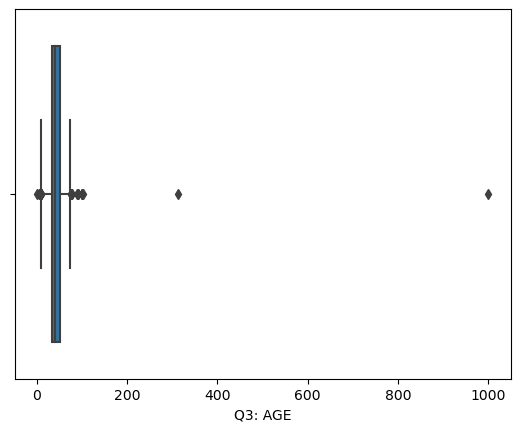

In [23]:
sns.boxplot(x=df['Q3: AGE'])

In [24]:
df['Q3: AGE'] = df['Q3: AGE'].apply(lambda x: np.nan if x < 10 or x > 100 else x)

<Axes: xlabel='Q3: AGE'>

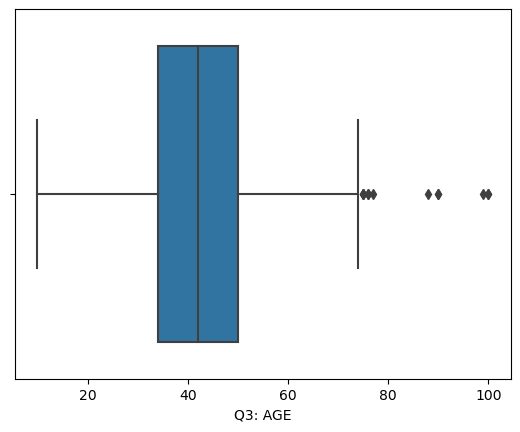

In [25]:
sns.boxplot(x=df['Q3: AGE'])

In [26]:
x= int(df['Q3: AGE'].mean())
df['Q3: AGE'].fillna(x,inplace=True)

<Axes: xlabel='Q3: AGE', ylabel='Count'>

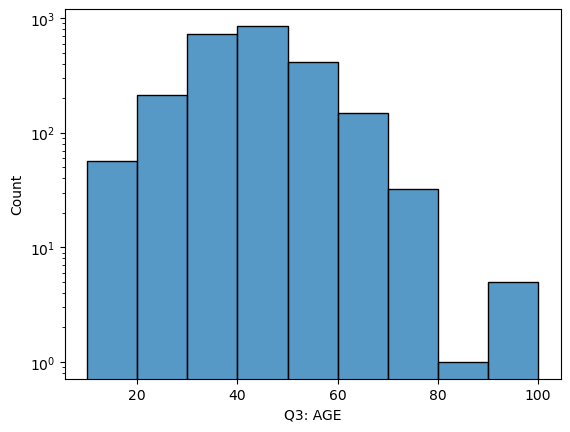

In [37]:
sns.histplot(df['Q3: AGE'],bins=[10,20,30,40,50,60,70,80,90,100],log=True)

In [117]:
df['Q3: AGE'] = df['Q3: AGE'].astype(int)


### 8 - clean ` country` column
> tip : note that country column has country names with different writing ways 
  - use fuzzywuzzy to deal with this problem
  - you should choose which best value to put in place of these NaNs ( mode, unknown,other ....etc)

In [118]:
df['Q4: COUNTRY'].unique()

array(['USA ', 'USA', 'us', 'usa', nan, 'canada', 'Canada', 'Us', 'US',
       'Murica', 'United States', 'uk', 'United Kingdom', 'united states',
       'Usa', 'United States ', 'United staes',
       'United States of America', 'UAE', 'England', 'UK', 'canada ',
       'Mexico', 'United states', 'u.s.a.', 'USAUSAUSA', 'america', 35,
       'france', 'United States of America ', 'U.S.A.', 'finland',
       'unhinged states', 'Canada ', 'united states of america',
       'US of A', 'Unites States', 'The United States', 'North Carolina ',
       'Unied States', 'Netherlands', 'germany', 'Europe', 'Earth', 'U S',
       'u.s.', 'U.K. ', 'Costa Rica', 'The United States of America',
       'unite states', 'U.S.', 46, 'cascadia', 'Australia',
       'insanity lately', 'Greece', 'USA? Hard to tell anymore..',
       "'merica", 'usas', 'Pittsburgh', 45, 'United State', 32, 'France',
       'australia', 'A', 'Can', 'Canae', 'New York', 'Trumpistan',
       'Ireland', 'United Sates', 'Korea', 

In [119]:
df['Q4: COUNTRY'] = df['Q4: COUNTRY'].str.strip().str.upper()


list_countries = np.array(['USA','AMERICA','UNITED STATES','CANADA','UK','UNITED KINGDOM','ENGLAND',
                         'CHINA','HONG KONG','SWEDEN','SPAIN','TAIWAN','IRELAND','THE NETHERLANDS',
                         'INDONESIA','SOUTH KOREA','SCOTLAND','SWITZERLAND','GERMANY','FRANCE','DENMARK','SOUTH AFRICA','AUSTRALIA',
                         'JAPAN','FINLAND','MEXICO','COSTA RICA','UAE','SINGAPORE']) 
countries = pd.Series(list_countries, index=range(1, len(list_countries) + 1))


for country_index, country_name in countries.items():
    
    matches = process.extract(country_name, df['Q4: COUNTRY'], limit=df.shape[0])
   
    for potential_match in matches:
       
        if potential_match[1] >= 80:
            
            df.loc[df['Q4: COUNTRY'] == potential_match[0], 'Q4: COUNTRY'] = country_name


print(df['Q4: COUNTRY'].unique())

['USA' nan 'CANADA' 'MURICA' 'UNITED STATES' 'UK' 'UNITED KINGDOM'
 'AMERICA' 'UAE' 'ENGLAND' 'MEXICO' 'U.S.A.' 'FRANCE' 'FINLAND' 'US OF A'
 'NORTH CAROLINA' 'THE NETHERLANDS' 'GERMANY' 'EUROPE' 'EARTH'
 'COSTA RICA' 'CASCADIA' 'AUSTRALIA' 'INSANITY LATELY' 'GREECE'
 'USA? HARD TO TELL ANYMORE..' 'PITTSBURGH' 'CANAE' 'NEW YORK'
 'TRUMPISTAN' 'IRELAND' 'SOUTH KOREA' 'CALIFORNIA' 'JAPAN' 'SOUTH AFRICA'
 'SCOTLAND' 'DENMARK' 'SWITZERLAND' 'UD' 'NEW JERSEY' 'INDONESIA'
 'ATLANTIS' 'MURRIKA' 'ALASKA' 'SOVIET CANUCKISTAN' 'SINGAPORE' 'CHINA'
 'TAIWAN' 'HONG KONG' 'SPAIN' 'SWEDEN' 'NARNIA' 'U S A'
 'SUBSCRIBE TO DM4UZ3 ON YOUTUBE' "I DON'T KNOW ANYMORE"
 'FEAR AND LOATHING']


In [120]:
mapping = {'MURICA':'USA','UNITED STATES':'USA','AMERICA':'USA','U.S.A':'USA','US OF A':'USA','UNITED KINGDOM':'UK',
         'U.S.A':'USA','NORTH CAROLINA':'USA','EUROPE':np.nan,'EARTH':np.nan,'CASCADIA':'USA','INSANITY LATELY':np.nan,'USA? HARD TO TELL ANYMORE..':'USA',
         'PITTSBURGH':'USA','CANAE':np.nan,'NEW YORK':'USA','TRUMPISTAN':np.nan,'CALIFORNIA':'USA',
          'UD':np.nan,'NEW JERSEY':'USA','ATLANTIS':np.nan,'MURRIKA':'USA','ALASKA':'USA',
         'SOVIET CANUCKISTAN':np.nan,'NARNIA':np.nan,'U S A':'USA','SUBSCRIBE TO DM4UZ3 ON YOUTUBE':np.nan,
        "I DON'T KNOW ANYMORE":np.nan,'FEAR AND LOATHING':np.nan,'U.S.A.':'USA' }
df['Q4: COUNTRY'].replace(mapping,inplace=True)

In [122]:
print(df['Q4: COUNTRY'].unique())


['USA' nan 'CANADA' 'UK' 'UAE' 'ENGLAND' 'MEXICO' 'FRANCE' 'FINLAND'
 'THE NETHERLANDS' 'GERMANY' 'COSTA RICA' 'AUSTRALIA' 'GREECE' 'IRELAND'
 'SOUTH KOREA' 'JAPAN' 'SOUTH AFRICA' 'SCOTLAND' 'DENMARK' 'SWITZERLAND'
 'INDONESIA' 'SINGAPORE' 'CHINA' 'TAIWAN' 'HONG KONG' 'SPAIN' 'SWEDEN']


In [123]:
df['Q4: COUNTRY'].fillna('MISSING',inplace=True)
df['Q4: COUNTRY'].value_counts()

Q4: COUNTRY
USA                2050
CANADA              226
MISSING              60
UK                   33
GERMANY              10
THE NETHERLANDS       7
AUSTRALIA             7
SCOTLAND              5
JAPAN                 5
IRELAND               5
MEXICO                4
SWITZERLAND           3
FRANCE                3
DENMARK               2
HONG KONG             2
CHINA                 2
SWEDEN                2
ENGLAND               2
SOUTH KOREA           2
SOUTH AFRICA          1
UAE                   1
COSTA RICA            1
INDONESIA             1
SINGAPORE             1
TAIWAN                1
GREECE                1
SPAIN                 1
FINLAND               1
Name: count, dtype: int64

<Axes: xlabel='Q4: COUNTRY'>

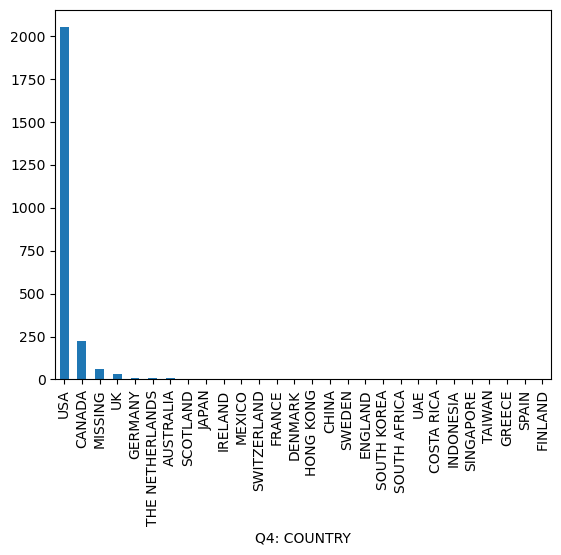

In [124]:
df['Q4: COUNTRY'].value_counts().plot.bar()

### 9 - clean ` area` column
> tip : area column has the same problem as country columns , but looking at all it's unique values may give us another way to deal with it rather than try to fix it

In [125]:
df['Q5: STATE, PROVINCE, COUNTY, ETC'].unique()

array(['NM', 'Virginia', 'or', 'exton pa', nan, 'Colorado ', 'ontario',
       'Ontario', 'Wa', 'Quebec', 'NY', 'California', 'Texas', 'NEW YORK',
       'CO', 'IN', 'MN', 'aberdeenshire', 'Alberta', 'Wisconsin, 53705',
       'RI', 'NC', 'Scotland', 'minnesota', 'Michigan', 'Florida',
       'New Jersey', 'VA', 'Colorado', 'Los Angeles, California', 'CA',
       'New York ', 'Chicago, Illinois', 'Nj', 'Wisconsin', 'Minnesota ',
       'London', 'mn', 'TEXAS', 'Illinois', 'District of Columbia',
       'Washington', 'Massachusetts ', 'OR', 'Montana', 'New York',
       'massachusetts', 'Abu Dhabi', 'TX', 'Arizona', 'Dc', 'yukon',
       'Pennsylvania ', 'MD', 'Ohio', 'Alberta ', 'OXFORDSHIRE', 'DC',
       'Iowa', 'Mn', 'TN', 'BC', 'Maryland', 'MI', 'Wisconsin ', 'alaska',
       'Ny', 'Colorado, Jefferson county ', 'Louisiana', 'pa',
       'CO, Larimer County', 'Nebraska ', 'Oregon', 'UT', 'ny',
       'Pennsylvania', 'CDMX', 'north carolina', 'Tennessee ', 'Texas ',
       'Knox cou

In [126]:
df['Q5: STATE, PROVINCE, COUNTY, ETC'].value_counts()

Q5: STATE, PROVINCE, COUNTY, ETC
California                                            132
CA                                                     89
Texas                                                  60
Ontario                                                56
Illinois                                               55
Oregon                                                 51
New York                                               42
WA                                                     40
NY                                                     37
Ohio                                                   37
BC                                                     33
Virginia                                               33
PA                                                     31
Washington                                             31
Massachusetts                                          30
MA                                                     29
IL                                     

In [127]:
df['Q5: STATE, PROVINCE, COUNTY, ETC']=df['Q5: STATE, PROVINCE, COUNTY, ETC'].str.upper()

In [70]:
df['Q5: STATE, PROVINCE, COUNTY, ETC'].unique()

array(['NM', 'VIRGINIA', 'OR', 'EXTON PA', nan, 'COLORADO ', 'ONTARIO',
       'WA', 'QUEBEC', 'NY', 'CALIFORNIA', 'TEXAS', 'NEW YORK', 'CO',
       'IN', 'MN', 'ABERDEENSHIRE', 'ALBERTA', 'WISCONSIN, 53705', 'RI',
       'NC', 'SCOTLAND', 'MINNESOTA', 'MICHIGAN', 'FLORIDA', 'NEW JERSEY',
       'VA', 'COLORADO', 'LOS ANGELES, CALIFORNIA', 'CA', 'NEW YORK ',
       'CHICAGO, ILLINOIS', 'NJ', 'WISCONSIN', 'MINNESOTA ', 'LONDON',
       'ILLINOIS', 'DISTRICT OF COLUMBIA', 'WASHINGTON', 'MASSACHUSETTS ',
       'MONTANA', 'MASSACHUSETTS', 'ABU DHABI', 'TX', 'ARIZONA', 'DC',
       'YUKON', 'PENNSYLVANIA ', 'MD', 'OHIO', 'ALBERTA ', 'OXFORDSHIRE',
       'IOWA', 'TN', 'BC', 'MARYLAND', 'MI', 'WISCONSIN ', 'ALASKA',
       'COLORADO, JEFFERSON COUNTY ', 'LOUISIANA', 'PA',
       'CO, LARIMER COUNTY', 'NEBRASKA ', 'OREGON', 'UT', 'PENNSYLVANIA',
       'CDMX', 'NORTH CAROLINA', 'TENNESSEE ', 'TEXAS ',
       'KNOX COUNTY, TENNESSEE', 'NEW MEXICO', 'MAINE',
       'VIRGINIA, ARLINGTON', 'MO',

In [128]:
df['Q5: STATE, PROVINCE, COUNTY, ETC'].fillna('MISSING',inplace=True)

### 10 - clean ` Q6` columns
>- tip : Q6 has all kinds of chocolate bars and questions with three distinct options to choose from (Joy, Meh, Despair).
- so all the column that has Q6 is a candy name , so you should go through all these column and you should choose which best value to put in place of these NaNs ( mode, unknown,other ....etc)

In [129]:
column_index = df.columns.get_loc('Q6 : 100 Grand Bar')
column_index2 = df.columns.get_loc('Q6 : York Peppermint Patties')
print(column_index)
print(column_index2)

5
107


In [130]:
for column_index in range(5, 108):
    column_name = df.columns[column_index]
    print(df[column_name].value_counts())

Q6 : 100 Grand Bar
JOY        873
MEH        755
DESPAIR     85
Name: count, dtype: int64
Q6 : Anonymous brown globs that come in black and orange wrappers\t(a.k.a. Mary Janes)
DESPAIR    1089
MEH         461
JOY         176
Name: count, dtype: int64
Q6 : Any full-sized candy bar
JOY        1559
MEH         212
DESPAIR      17
Name: count, dtype: int64
Q6 : Black Jacks
DESPAIR    793
MEH        617
JOY         92
Name: count, dtype: int64
Q6 : Bonkers (the candy)
MEH        857
DESPAIR    495
JOY        116
Name: count, dtype: int64
Q6 : Bonkers (the board game)
MEH        715
DESPAIR    546
JOY        193
Name: count, dtype: int64
Q6 : Bottle Caps
MEH        670
DESPAIR    560
JOY        465
Name: count, dtype: int64
Q6 : Box'o'Raisins
DESPAIR    1179
MEH         476
JOY         117
Name: count, dtype: int64
Q6 : Broken glow stick
DESPAIR    1625
MEH         105
JOY          24
Name: count, dtype: int64
Q6 : Butterfinger
JOY        1177
MEH         460
DESPAIR     141
Name: count, dty

In [131]:
for column_index2 in range(5, 108):
    column_name = df.columns[column_index2]
    df[column_name].fillna("MEH", inplace=True)

In [132]:
for column_index in range(5, 108):
    column_name = df.columns[column_index]
    print(df[column_name].value_counts())

Q6 : 100 Grand Bar
MEH        1481
JOY         873
DESPAIR      85
Name: count, dtype: int64
Q6 : Anonymous brown globs that come in black and orange wrappers\t(a.k.a. Mary Janes)
MEH        1174
DESPAIR    1089
JOY         176
Name: count, dtype: int64
Q6 : Any full-sized candy bar
JOY        1559
MEH         863
DESPAIR      17
Name: count, dtype: int64
Q6 : Black Jacks
MEH        1554
DESPAIR     793
JOY          92
Name: count, dtype: int64
Q6 : Bonkers (the candy)
MEH        1828
DESPAIR     495
JOY         116
Name: count, dtype: int64
Q6 : Bonkers (the board game)
MEH        1700
DESPAIR     546
JOY         193
Name: count, dtype: int64
Q6 : Bottle Caps
MEH        1414
DESPAIR     560
JOY         465
Name: count, dtype: int64
Q6 : Box'o'Raisins
DESPAIR    1179
MEH        1143
JOY         117
Name: count, dtype: int64
Q6 : Broken glow stick
DESPAIR    1625
MEH         790
JOY          24
Name: count, dtype: int64
Q6 : Butterfinger
JOY        1177
MEH        1121
DESPAIR     141
N

### 11 - clean ` dress` column
>tip : you should choose which best value to put in place of these NaNs ( mode, unknown,other ....etc)

In [133]:
df['Q10: DRESS'].unique()
df['Q10: DRESS'].isna().sum()

723

<Axes: xlabel='Q10: DRESS'>

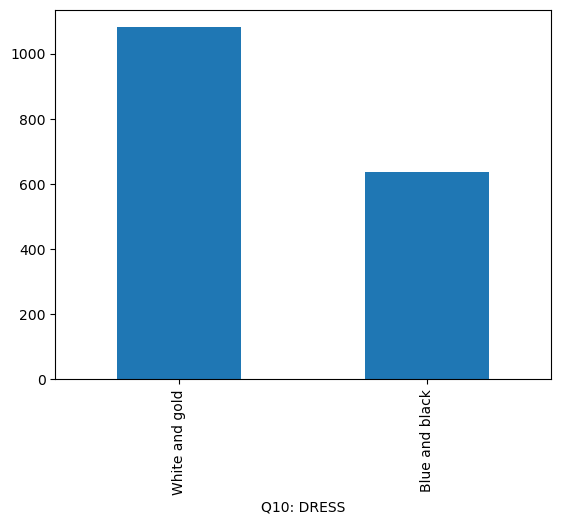

In [134]:
df['Q10: DRESS'].value_counts().plot.bar()

In [135]:
mapping={np.nan:"can't tell"}
df['Q10: DRESS'].replace(mapping,inplace=True)

<Axes: ylabel='count'>

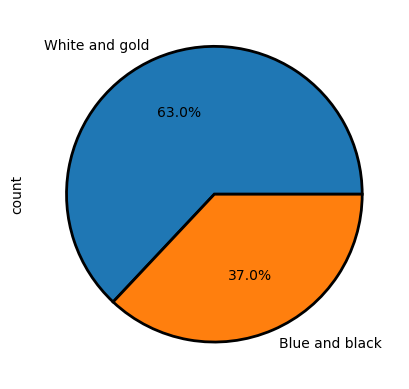

In [15]:
df['Q10: DRESS'].value_counts().plot.pie(autopct='%1.1f%%',wedgeprops = {"edgecolor" : "black", 
                      'linewidth': 2, 
                      'antialiased': True})


### 12 - clean ` day` column
>tip : you should choose which best value to put in place of these NaNs ( mode, unknown,other ....etc)

In [137]:
df['Q11: DAY'].value_counts()

Q11: DAY
Friday    1091
Sunday     644
Name: count, dtype: int64

In [138]:
df['Q11: DAY'].unique()

array(['Sunday', nan, 'Friday'], dtype=object)

In [139]:
df['Q11: DAY'].fillna(df['Q11: DAY'].mode()[0],inplace=True)

<Axes: xlabel='Q11: DAY'>

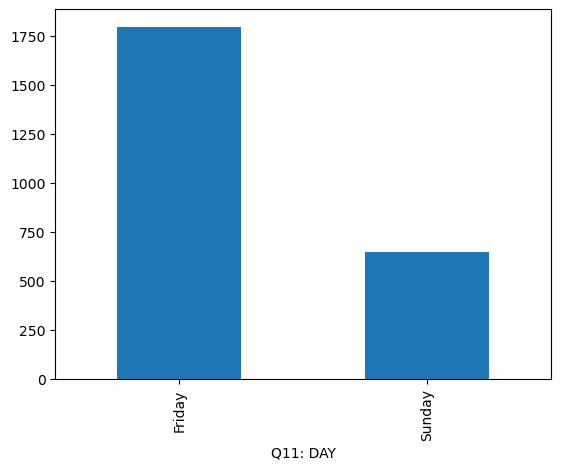

In [140]:
df['Q11: DAY'].value_counts().plot.bar()

### 13 - check
> after finish cleaning you should make sure your data is clean and that :
- there is no wrong data type
- there is no NaN values 
- all the column are cleaing and ready for the next step `EDA`

### 14 - write a summary about all the cleaning steps 

In [141]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2439 entries, 90272821 to 90314802
Columns: 112 entries, Q1: GOING OUT? to Q11: DAY
dtypes: category(1), int32(1), object(110)
memory usage: 2.1+ MB


In [142]:
df['Q7: JOY OTHER'].value_counts()

Q7: JOY OTHER
Almond Joy                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               10
Beer                                                                                                                                                                                                                                                                                                                                                                                          

In [143]:
df['Q8: DESPAIR OTHER'].value_counts()


Q8: DESPAIR OTHER
Trump                                                                                                                                                                                                                                                                                                                                                                                                                                                 7
Popcorn balls                                                                                                                                                                                                                                                                                                                                                                                                                                         3
Almond Joy, Mounds                                                                                    

In [144]:
df.drop(columns=['Q8: DESPAIR OTHER','Q7: JOY OTHER'],inplace=True)

In [145]:
df.isnull().sum().to_frame().T

,Q1: GOING OUT?,Q2: GENDER,Q3: AGE,Q4: COUNTRY,"Q5: STATE, PROVINCE, COUNTY, ETC",Q6 : 100 Grand Bar,Q6 : Anonymous brown globs that come in black and orange wrappers\t(a.k.a. Mary Janes),Q6 : Any full-sized candy bar,Q6 : Black Jacks,Q6 : Bonkers (the candy),Q6 : Bonkers (the board game),Q6 : Bottle Caps,Q6 : Box'o'Raisins,Q6 : Broken glow stick,Q6 : Butterfinger,Q6 : Cadbury Creme Eggs,Q6 : Candy Corn,Q6 : Candy that is clearly just the stuff given out for free at restaurants,Q6 : Caramellos,"Q6 : Cash, or other forms of legal tender",Q6 : Chardonnay,Q6 : Chick-o-Sticks (we don’t know what that is),Q6 : Chiclets,Q6 : Coffee Crisp,Q6 : Creepy Religious comics/Chick Tracts,Q6 : Dental paraphenalia,Q6 : Dots,Q6 : Dove Bars,Q6 : Fuzzy Peaches,Q6 : Generic Brand Acetaminophen,Q6 : Glow sticks,Q6 : Goo Goo Clusters,Q6 : Good N' Plenty,Q6 : Gum from baseball cards,Q6 : Gummy Bears straight up,Q6 : Hard Candy,Q6 : Healthy Fruit,Q6 : Heath Bar,Q6 : Hershey's Dark Chocolate,Q6 : Hershey’s Milk Chocolate,Q6 : Hershey's Kisses,Q6 : Hugs (actual physical hugs),Q6 : Jolly Rancher (bad flavor),Q6 : Jolly Ranchers (good flavor),Q6 : JoyJoy (Mit Iodine!),Q6 : Junior Mints,Q6 : Senior Mints,Q6 : Kale smoothie,Q6 : Kinder Happy Hippo,Q6 : Kit Kat,Q6 : LaffyTaffy,Q6 : LemonHeads,Q6 : Licorice (not black),Q6 : Licorice (yes black),Q6 : Lindt Truffle,Q6 : Lollipops,Q6 : Mars,Q6 : Maynards,Q6 : Mike and Ike,Q6 : Milk Duds,Q6 : Milky Way,Q6 : Regular M&Ms,Q6 : Peanut M&M’s,Q6 : Blue M&M's,Q6 : Red M&M's,Q6 : Green Party M&M's,Q6 : Independent M&M's,Q6 : Abstained from M&M'ing.,Q6 : Minibags of chips,Q6 : Mint Kisses,Q6 : Mint Juleps,Q6 : Mr. Goodbar,Q6 : Necco Wafers,Q6 : Nerds,Q6 : Nestle Crunch,Q6 : Now'n'Laters,Q6 : Peeps,Q6 : Pencils,Q6 : Pixy Stix,Q6 : Real Housewives of Orange County Season 9 Blue-Ray,Q6 : Reese’s Peanut Butter Cups,Q6 : Reese's Pieces,Q6 : Reggie Jackson Bar,Q6 : Rolos,Q6 : Sandwich-sized bags filled with BooBerry Crunch,Q6 : Skittles,Q6 : Smarties (American),Q6 : Smarties (Commonwealth),Q6 : Snickers,Q6 : Sourpatch Kids (i.e. abominations of nature),Q6 : Spotted Dick,Q6 : Starburst,Q6 : Sweet Tarts,Q6 : Swedish Fish,Q6 : Sweetums (a friend to diabetes),Q6 : Take 5,Q6 : Tic Tacs,Q6 : Those odd marshmallow circus peanut things,Q6 : Three Musketeers,Q6 : Tolberone something or other,Q6 : Trail Mix,Q6 : Twix,"Q6 : Vials of pure high fructose corn syrup, for main-lining into your vein",Q6 : Vicodin,Q6 : Whatchamacallit Bars,Q6 : White Bread,Q6 : Whole Wheat anything,Q6 : York Peppermint Patties,Q10: DRESS,Q11: DAY
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [146]:
df.shape

(2439, 110)

In [4]:
dic = {'TOB10_BEST_CANDY':['Kit Kat','Twix','Snickers','Tolberone','Peanut M&M’s','Lindt Truffle','Nestle Crunch','Milky Way','Butterfinger','Dove Bars'],
    'TOB10_WORST_CANDY':['Candy that is given out for free at restaurants',"Box'o'Raisins","Mary Janes","Senior Mints",'Necco Wafers',
                        'Black Jacks','Chiclets','Tic Tacs','Candy Corn',"Good N' Plenty"]}


In [5]:
df2=pd.DataFrame(dic)
df2.index = np.arange(1, len(df2) + 1)

In [ ]:
# top 10 candy and worst candy

In [6]:
df2

,TOB10_BEST_CANDY,TOB10_WORST_CANDY
1,Kit Kat,Candy that is given out for free at restaurants
2,Twix,Box'o'Raisins
3,Snickers,Mary Janes
4,Tolberone,Senior Mints
5,Peanut M&M’s,Necco Wafers
6,Lindt Truffle,Black Jacks
7,Nestle Crunch,Chiclets
8,Milky Way,Tic Tacs
9,Butterfinger,Candy Corn
10,Dove Bars,Good N' Plenty


In [9]:
df2.columns[1]

'TOB10_WORST_CANDY'